# Beer Recipes Exploratory Analysis

In [2]:
import numpy as np
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="dark")

In [6]:
df = pd.read_csv('recipeData.csv' , index_col='BeerID', encoding='latin1')

In [7]:
df.head()

,Name,URL,Style,StyleID,Size(L),OG,FG,ABV,IBU,Color,...,BoilGravity,Efficiency,MashThickness,SugarScale,BrewMethod,PitchRate,PrimaryTemp,PrimingMethod,PrimingAmount,UserId
BeerID,,,,,,,,,,,,,,,,,,,,,
1,Vanilla Cream Ale,/homebrew/recipe/view/1633/vanilla-cream-ale,Cream Ale,45,21.77,1.055,1.013,5.48,17.65,4.83,...,1.038,70.0,NaN,Specific Gravity,All Grain,NaN,17.78,corn sugar,4.5 oz,116.0
2,Southern Tier Pumking clone,/homebrew/recipe/view/16367/southern-tier-pumk...,Holiday/Winter Special Spiced Beer,85,20.82,1.083,1.021,8.16,60.65,15.64,...,1.070,70.0,NaN,Specific Gravity,All Grain,NaN,NaN,NaN,NaN,955.0
3,Zombie Dust Clone - EXTRACT,/homebrew/recipe/view/5920/zombie-dust-clone-e...,American IPA,7,18.93,1.063,1.018,5.91,59.25,8.98,...,NaN,70.0,NaN,Specific Gravity,extract,NaN,NaN,NaN,NaN,NaN
4,Zombie Dust Clone - ALL GRAIN,/homebrew/recipe/view/5916/zombie-dust-clone-a...,American IPA,7,22.71,1.061,1.017,5.80,54.48,8.50,...,NaN,70.0,NaN,Specific Gravity,All Grain,NaN,NaN,NaN,NaN,NaN
5,Bakke Brygg Belgisk Blonde 50 l,/homebrew/recipe/view/89534/bakke-brygg-belgis...,Belgian Blond Ale,20,50.00,1.060,1.010,6.48,17.84,4.57,...,1.050,72.0,NaN,Specific Gravity,All Grain,NaN,19.00,Sukkerlake,6-7 g sukker/l,18325.0


In [11]:
print(df.info(verbose=False))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73861 entries, 1 to 73861
Columns: 22 entries, Name to UserId
dtypes: float64(13), int64(2), object(7)
memory usage: 15.5+ MB
None


In [12]:
df.describe()

,StyleID,Size(L),OG,FG,ABV,IBU,Color,BoilSize,BoilTime,BoilGravity,Efficiency,MashThickness,PitchRate,PrimaryTemp,UserId
count,73861.000000,73861.000000,73861.000000,73861.000000,73861.000000,73861.000000,73861.000000,73861.000000,73861.000000,70871.000000,73861.000000,43997.000000,34609.000000,51199.000000,23371.000000
mean,60.179432,43.929775,1.406266,1.075865,6.136865,44.276186,13.404989,49.724919,65.074870,1.353955,66.354881,2.127235,0.750468,19.175641,43078.069188
std,56.811462,180.373492,2.196908,0.432524,1.883510,42.945508,11.944511,193.246427,15.024228,1.930989,14.091686,1.682347,0.394262,4.219676,27734.252556
min,1.000000,1.000000,1.000000,-0.003000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-17.780000,49.000000
25%,10.000000,18.930000,1.051000,1.011000,5.080000,23.370000,5.170000,20.820000,60.000000,1.040000,65.000000,1.500000,0.350000,18.000000,20984.000000
50%,35.000000,20.820000,1.058000,1.013000,5.790000,35.770000,8.440000,27.440000,60.000000,1.047000,70.000000,1.500000,0.750000,20.000000,42897.000000
75%,111.000000,23.660000,1.069000,1.017000,6.830000,56.380000,16.790000,30.000000,60.000000,1.060000,75.000000,3.000000,1.000000,20.000000,57841.000000
max,176.000000,9200.000000,34.034500,23.424600,54.720000,3409.300000,186.000000,9700.000000,240.000000,52.600000,100.000000,100.000000,2.000000,114.000000,134362.000000


Next, let's look at how good the data is... well, right now I'll focus on missing values.

Just by looking at the first 5 rows above, we can see that there's a couple of null values. I think it's safe to expect a couple of null value throughout the whole data set. let's see how many we have

<AxesSubplot:>

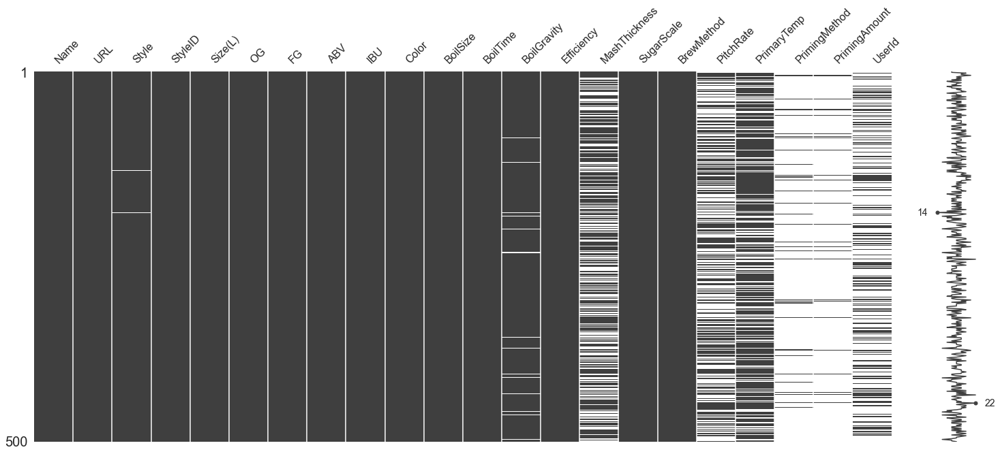

In [14]:
%matplotlib inline
msno.matrix(df.sample(500))

You can also see that the visualization above is only looking at 500 rows of the whole dataset, which might not seem like a lot, but I did check with higher number and the distribution of null values is pretty similar

In [15]:
null_priming = df['PrimingMethod'].isnull()
print('Priming Method is null on {} rows out of {}, so {} % of the time'.format(null_priming.sum(), len(df), round((null_priming.sum()/len(df))*100,2)))

Priming Method is null on 67095 rows out of 73861, so 90.84 % of the time


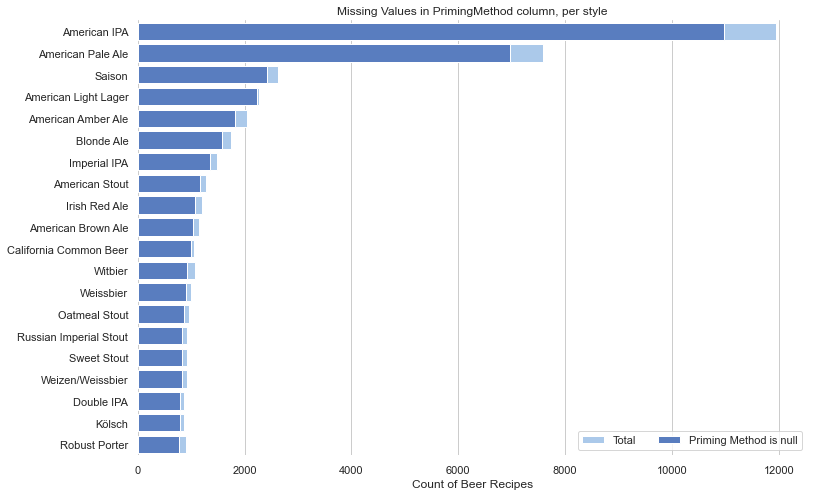

In [19]:
style_cnt = df.loc[:,['Style','PrimingMethod']]
style_cnt['NullPriming'] = style_cnt['PrimingMethod'].isnull()
style_cnt['Count'] = 1
style_cnt_grp = style_cnt.loc[:,['Style','Count','NullPriming']].groupby('Style').sum()

style_cnt_grp = style_cnt_grp.sort_values('NullPriming', ascending=False)
style_cnt_grp.reset_index(inplace=True)

def stacked_bar_plot(df, x_total, x_sub_total, sub_total_label, y):
    # Initialize the matplotlib figure
    f, ax = plt.subplots(figsize=(12, 8))
    
    # Plot the total
    sns.set_color_codes("pastel")
    sns.barplot(x=x_total, y=y, data=df, label="Total", color="b")

    # Plot
    sns.set_color_codes("muted")
    sns.barplot(x=x_sub_total, y=y, data=df, label=sub_total_label, color="b")
    
    # Add a legend and informative axis label
    ax.legend(ncol=2, loc="lower right", frameon=True)
    sns.despine(left=True, bottom=True)
    
    return f, ax
    
f, ax = stacked_bar_plot(style_cnt_grp[:20], 'Count', 'NullPriming', 'Priming Method is null', 'Style')
ax.set(title='Missing Values in PrimingMethod column, per style', ylabel='', xlabel='Count of Beer Recipes')
sns.despine(left=True, bottom=True)

In [21]:
print( list(df.select_dtypes(include=object).columns))

['Name', 'URL', 'Style', 'SugarScale', 'BrewMethod', 'PrimingMethod', 'PrimingAmount']


In [22]:
print(df.PrimingAmount.unique())

['4.5 oz' nan '6-7 g sukker/l' ...
 '4.79oz for 6gal  4.5oz for 5.75  4.32 for 5.5gal  4.12oz for 5.25gal  3.93oz for 5 gal.'
 '13.5' '7 gram / liter']


SugarScale has 0 null values


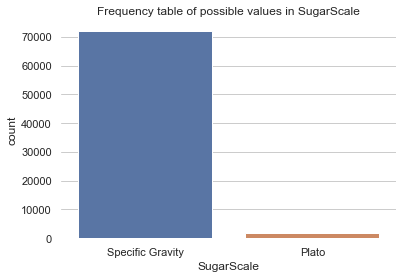

In [23]:
ax = sns.countplot(x='SugarScale', data=df)
ax.set(title='Frequency table of possible values in SugarScale')
sns.despine(left=True, bottom=True)

print('SugarScale has {} null values'.format(df.SugarScale.isnull().sum()))

BrewMethod has 0 null values


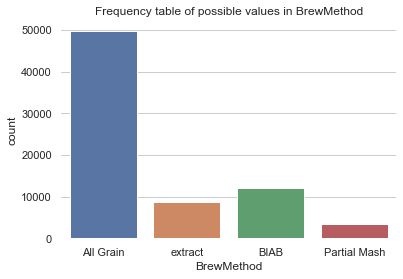

In [25]:
ax = sns.countplot(x='BrewMethod', data=df)
ax.set(title='Frequency table of possible values in BrewMethod')
sns.despine(left=True, bottom=True)

print('BrewMethod has {} null values'.format(df.BrewMethod.isnull().sum()))

In [28]:
print('PrimingMethod has {} unique values'.format(df.PrimingMethod.nunique()))
print(df.PrimingMethod.unique()[:20])

PrimingMethod has 874 unique values
['corn sugar' nan 'Sukkerlake' 'Corn Sugar' 'Priming Sugar'
 'Keg - Force Carb.' 'Force Carb' 'Force carb' 'Forced Carbonation'
 'DME boiled in 2 cups water' 'force carb' 'Dextrose' 'Sukker' 'Sugar'
 'FORCED CARB' 'Inverted sugar' 'honey' 'CO2' 'Add in last 5 of boil'
 'priming sugar']


In [29]:
print( list( df.select_dtypes(exclude=object)))

['StyleID', 'Size(L)', 'OG', 'FG', 'ABV', 'IBU', 'Color', 'BoilSize', 'BoilTime', 'BoilGravity', 'Efficiency', 'MashThickness', 'PitchRate', 'PrimaryTemp', 'UserId']


In [30]:
def get_sg_from_plato(plato):
    sg = 1 + (plato / (258.6 - ( (plato/258.2) *227.1) ) )
    return sg

df['OG_sg'] = df.apply(lambda row: get_sg_from_plato(row['OG']) if row['SugarScale'] == 'Plato' else row['OG'], axis=1)
df['FG_sg'] = df.apply(lambda row: get_sg_from_plato(row['FG']) if row['SugarScale'] == 'Plato' else row['FG'], axis=1)
df['BoilGravity_sg'] = df.apply(lambda row: get_sg_from_plato(row['BoilGravity']) if row['SugarScale'] == 'Plato' else row['BoilGravity'], axis=1)

In [31]:
num_feats_list = ['Size(L)', 'OG_sg', 'FG_sg', 'ABV', 'IBU', 'Color', 'BoilSize', 'BoilTime', 'BoilGravity_sg', 'Efficiency', 'MashThickness', 'PitchRate', 'PrimaryTemp']
df.loc[:, num_feats_list].describe().T

,count,mean,std,min,25%,50%,75%,max
Size(L),73861.0,43.929775,180.373492,1.000,18.930,20.820,23.660,9200.000
OG_sg,73861.0,1.060846,0.057580,1.000,1.050,1.057,1.067,15.897
FG_sg,73861.0,1.013976,0.012187,0.991,1.011,1.013,1.016,3.974
ABV,73861.0,6.136865,1.883510,0.000,5.080,5.790,6.830,54.720
IBU,73861.0,44.276186,42.945508,0.000,23.370,35.770,56.380,3409.300
Color,73861.0,13.404989,11.944511,0.000,5.170,8.440,16.790,186.000
BoilSize,73861.0,49.724919,193.246427,1.000,20.820,27.440,30.000,9700.000
BoilTime,73861.0,65.074870,15.024228,0.000,60.000,60.000,60.000,240.000
BoilGravity_sg,70871.0,1.053498,0.027301,1.000,1.040,1.047,1.058,1.500
Efficiency,73861.0,66.354881,14.091686,0.000,65.000,70.000,75.000,100.000


In [32]:
vlow_scale_feats = ['OG_sg', 'FG_sg', 'BoilGravity_sg', 'PitchRate']
low_scale_feats = ['ABV', 'MashThickness']
mid_scale_feats = ['Color', 'BoilTime', 'Efficiency', 'PrimaryTemp']
high_scale_feats = ['IBU', 'Size(L)',  'BoilSize']

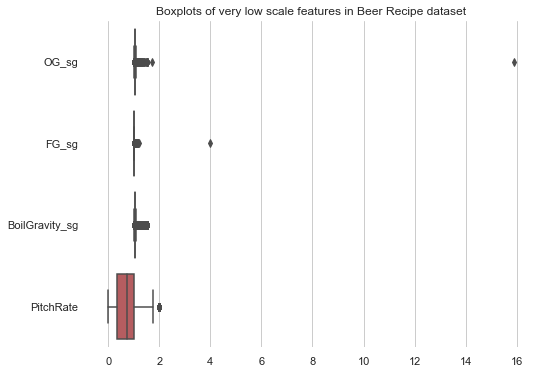

In [35]:
f, ax = plt.subplots(figsize=(8,6))
ax = sns.boxplot(data=df.loc[:, vlow_scale_feats], orient='h')
ax.set(title='Boxplots of very low scale features in Beer Recipe dataset')
sns.despine(left=True, bottom=True)

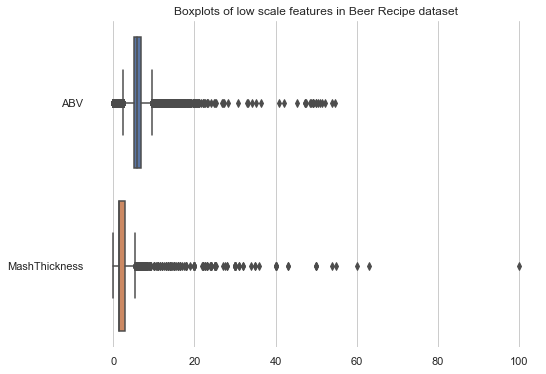

In [39]:
f, ax = plt.subplots(figsize=(8,6))
ax = sns.boxplot(data=df.loc[:, low_scale_feats], orient='h')
ax.set(title='Boxplots of low scale features in Beer Recipe dataset')
sns.despine(left=True, bottom=True)

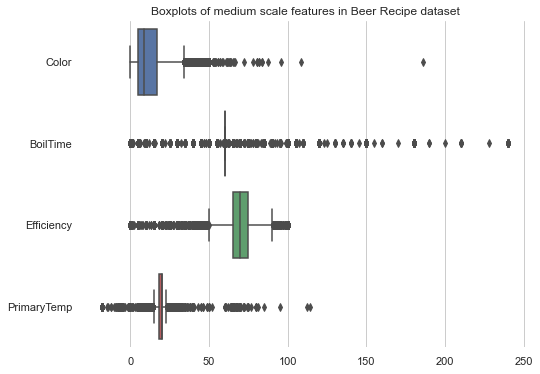

In [42]:
f, ax = plt.subplots(figsize=(8,6))
ax = sns.boxplot(data=df.loc[:, mid_scale_feats], orient='h')
ax.set(title='Boxplots of medium scale features in Beer Recipe dataset')
sns.despine(left=True, bottom=True)

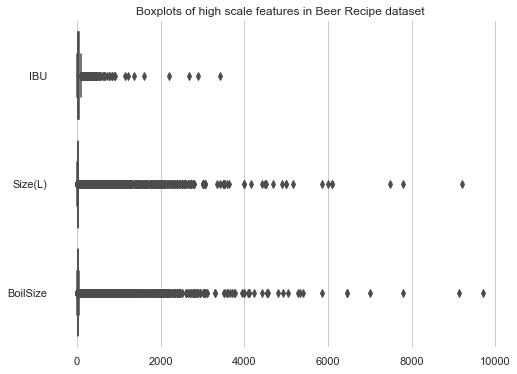

In [44]:
f, ax = plt.subplots(figsize=(8,6))
ax = sns.boxplot(data=df.loc[:, high_scale_feats], orient='h')
ax.set(title='Boxplots of high scale features in Beer Recipe dataset')
sns.despine(left=True, bottom=True)

In [46]:
print('There are {} different styles of beer'.format(df.StyleID.nunique()))

There are 176 different styles of beer


/Users/shivambhosale/opt/anaconda3/envs/tensorflow/lib/python3.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  


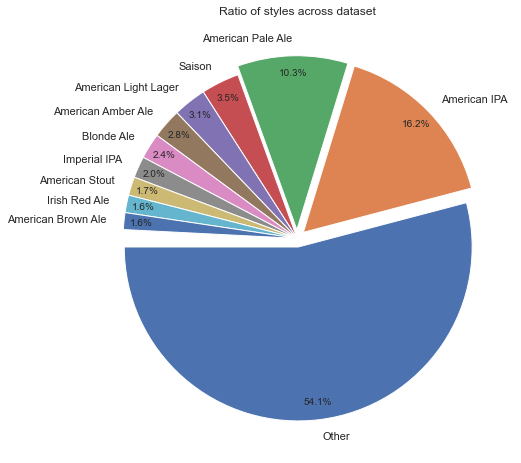

In [49]:
top10_style = list(style_cnt_grp['Style'][:10].values)

# Group by current count information computed earlier and group every style not in top20 together
style_cnt_other = style_cnt_grp.loc[:, ['Style','Count']]
style_cnt_other.Style = style_cnt_grp.Style.apply(lambda x: x if x in top10_style else 'Other')
style_cnt_other = style_cnt_other.groupby('Style').sum()

# Get ratio of each style
style_cnt_other['Ratio'] = style_cnt_other.Count.apply(lambda x: x/float(len(df)))
style_cnt_other = style_cnt_other.sort_values('Count', ascending=False)

f, ax = plt.subplots(figsize=(8, 8))
explode = (0.05, 0.05, 0.05, 0, 0, 0, 0, 0, 0, 0, 0)
plt.pie(x=style_cnt_other['Ratio'], labels=list(style_cnt_other.index), startangle = 180, autopct='%1.1f%%', pctdistance= .9, explode=explode)
plt.title('Ratio of styles across dataset')
plt.show()

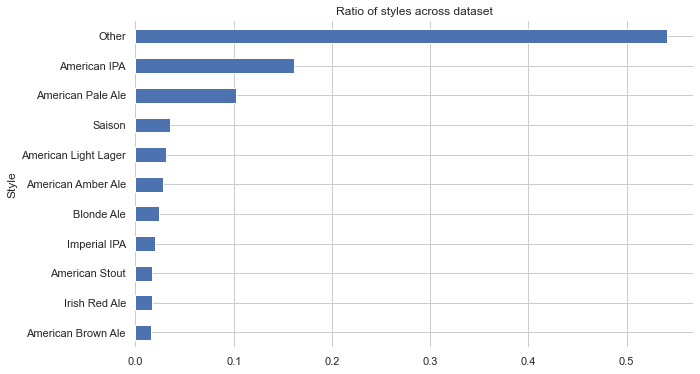

In [50]:
#plt.barh(list(style_cnt_other.index), style_cnt_other['Count'])
style_cnt_other['Ratio'].plot(kind='barh', figsize=(10,6),)
plt.title('Ratio of styles across dataset')
sns.despine(left=True, bottom=True)
plt.gca().invert_yaxis()

## Correlation

In [7]:
df.corr()

,StyleID,Size(L),OG,FG,ABV,IBU,Color,BoilSize,BoilTime,BoilGravity,Efficiency,MashThickness,PitchRate,PrimaryTemp,UserId
StyleID,1.000000,-0.006522,0.002699,0.007336,0.006617,-0.141124,0.166669,-0.006301,0.077969,0.002326,0.021515,0.006167,0.079123,-0.019661,-0.006596
Size(L),-0.006522,1.000000,0.162237,0.141614,-0.013527,-0.029917,-0.018068,0.994143,0.044848,0.176071,0.108826,0.019246,0.026623,0.004278,-0.013027
OG,0.002699,0.162237,1.000000,0.936347,0.029432,-0.001655,0.013632,0.165162,0.031825,0.968138,0.067610,0.046841,0.020556,0.000518,-0.001912
FG,0.007336,0.141614,0.936347,1.000000,0.026851,-0.000719,0.029848,0.142974,0.028930,0.908611,0.061173,0.040541,0.013446,0.004477,-0.006508
ABV,0.006617,-0.013527,0.029432,0.026851,1.000000,0.290889,0.271332,-0.009800,0.120629,0.025421,0.047853,-0.069633,0.132699,0.060065,-0.019513
IBU,-0.141124,-0.029917,-0.001655,-0.000719,0.290889,1.000000,0.060283,-0.028258,0.078694,-0.007498,-0.033172,-0.044381,0.006180,0.035510,-0.040685
Color,0.166669,-0.018068,0.013632,0.029848,0.271332,0.060283,1.000000,-0.016798,0.058089,0.013451,-0.017297,-0.038406,0.016061,0.025622,-0.004933
BoilSize,-0.006301,0.994143,0.165162,0.142974,-0.009800,-0.028258,-0.016798,1.000000,0.051219,0.175972,0.121971,0.017772,0.030936,0.003000,-0.015507
BoilTime,0.077969,0.044848,0.031825,0.028930,0.120629,0.078694,0.058089,0.051219,1.000000,0.026921,0.161295,0.006850,0.190922,-0.079809,-0.055086
BoilGravity,0.002326,0.176071,0.968138,0.908611,0.025421,-0.007498,0.013451,0.175972,0.026921,1.000000,0.059132,0.050944,0.016216,0.002268,-0.003206
